<a href="https://colab.research.google.com/github/Klevertak/CV_Tasks/blob/master/TransformetBasics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [8]:
import os
from os.path import exists
import torch
import torch.nn as nn
from torch.nn.functional import log_softmax, pad
import math
import copy
import time
from torch.optim.lr_scheduler import LambdaLR
import pandas as pd
import altair as alt
from torchtext.data.functional import to_map_style_dataset
from torch.utils.data import DataLoader
from torchtext.vocab import build_vocab_from_iterator
import torchtext.datasets as datasets
import spacy
import GPUtil
import warnings
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP

In [9]:
# ! pip install GPUtil

In [10]:
import torch.nn.functional as F

In [11]:
import numpy as np

In [12]:
from matplotlib import pyplot as plt

In [13]:
# Set to False to skip notebook execution (e.g. for debugging)
warnings.filterwarnings("ignore")
RUN_EXAMPLES = True

In [14]:
# Some convenience helper functions used throughout the notebook


def is_interactive_notebook():
    return __name__ == "__main__"


def show_example(fn, args=[]):
    if __name__ == "__main__" and RUN_EXAMPLES:
        return fn(*args)


def execute_example(fn, args=[]):
    if __name__ == "__main__" and RUN_EXAMPLES:
        fn(*args)


class DummyOptimizer(torch.optim.Optimizer):
    def __init__(self):
        self.param_groups = [{"lr": 0}]
        None

    def step(self):
        None

    def zero_grad(self, set_to_none=False):
        None


class DummyScheduler:
    def step(self):
        None

### Base Encoder-decoder model

In [15]:
class EncoderDecoder(nn.Module):
    """
    A standard Encoder-Decoder architecture. Base for this and many
    other models.
    """

    def __init__(self, encoder, decoder, src_embed, tgt_embed, generator):
        super(EncoderDecoder, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
        self.src_embed = src_embed
        self.tgt_embed = tgt_embed
        self.generator = generator

    def forward(self, src, tgt, src_mask, tgt_mask):
        "Take in and process masked src and target sequences."
        return self.decode(self.encode(src, src_mask), src_mask, tgt, tgt_mask)

    def encode(self, src, src_mask):
        return self.encoder(self.src_embed(src), src_mask)

    def decode(self, memory, src_mask, tgt, tgt_mask):
        return self.decoder(self.tgt_embed(tgt), memory, src_mask, tgt_mask)

In [16]:
class Generator(nn.Module):
    "Define standard linear + softmax generation step."

    def __init__(self, d_model, vocab):
        super(Generator, self).__init__()
        self.proj = nn.Linear(d_model, vocab)

    def forward(self, x):
        return log_softmax(self.proj(x), dim=-1)

In [17]:
def clone_layer(layer, N):
    return nn.ModuleList([copy.deepcopy(layer) for _ in range(N)])

### Encoder definition

In [18]:
class Encoder(nn.Module):
    """
        An encoder on N layers with normalisation
    """
    def __init__(self, layer, N):
        super(Encoder, self).__init__()
        self._layers = clone_layer(layer, N)
        self._norm = nn.LayerNorm(layer.size)

    def forward(self, x_in, mask):
        x_cur = x_in
        for l in self._layers:
            x_cur = l(x_cur, mask)
        return self._norm(x_cur)

In [19]:
class SublayerConnection(nn.Module):
    """
    A residual connection followed by a layer norm.
    Note for code simplicity the norm is first as opposed to last.
    """

    def __init__(self, size, dropout):
        super(SublayerConnection, self).__init__()
        self._norm = nn.LayerNorm(size)
        self._dropout = nn.Dropout(dropout)

    def forward(self, x, sublayer):
        "Apply residual connection to any sublayer with the same size."
        return x + self._dropout(sublayer(self._norm(x)))

In [20]:
class EncoderLayer(nn.Module):

    def __init__(self, size, attn_layer, ffn_layer, dropout):
        super(EncoderLayer, self).__init__()
        self._attn_layer = attn_layer
        self._ffn_layer = ffn_layer
        self._sublayers = clone_layer(SublayerConnection(size, dropout), 2)
        self.size = size

    def forward(self, x_in, mask):
        x_out = self._sublayers[0](x_in, lambda x: self._attn_layer(x, x, x, mask))
        return self._sublayers[1](x_out, self._ffn_layer)

### Decoder definition

In [21]:
class Decoder(nn.Module):
    """
        An decoder of N layers with normalisation
    """
    def __init__(self, layer, N):
        super(Decoder, self).__init__()
        self._layers = clone_layer(layer, N)
        self._norm = nn.LayerNorm(layer.size)

    def forward(self, x_in, memory, src_mask, tgt_mask):
        x_cur = x_in
        for l in self._layers:
            x_cur = l(x_cur, memory, src_mask, tgt_mask)
        return self._norm(x_cur)

In [22]:
class DecoderLayer(nn.Module):

    def __init__(self, size, self_attn, src_attn, ffn_layer, dropout):
        super(DecoderLayer, self).__init__()
        self._self_attn = self_attn
        self._src_attn = src_attn
        self._ffn_layer = ffn_layer
        self._sublayers = clone_layer(SublayerConnection(size, dropout), 3)
        self.size = size

    def forward(self, x_in, memory, src_mask, tgt_mask):
        x_out = self._sublayers[0](x_in, lambda x: self._self_attn(x, x, x, tgt_mask))
        x_out = self._sublayers[1](x_out, lambda x: self._src_attn(x, memory, memory, src_mask))
        return self._sublayers[2](x_out, self._ffn_layer)

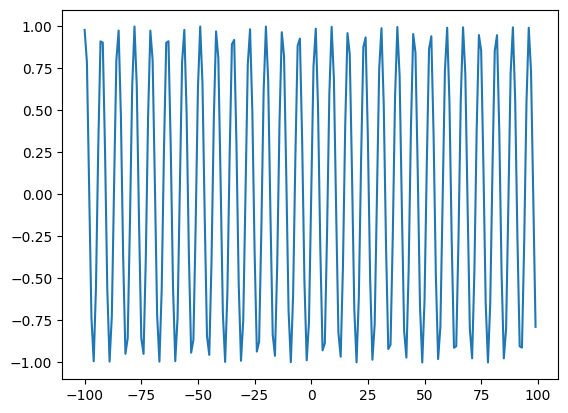

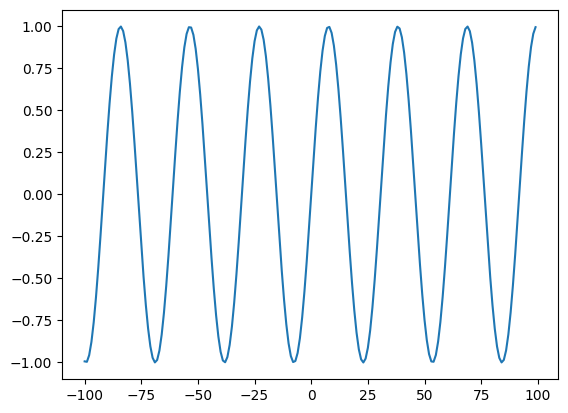

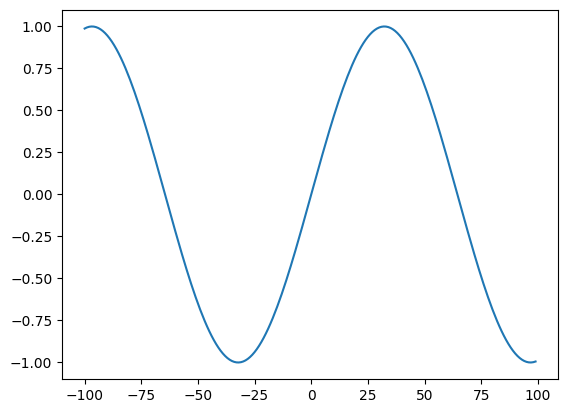

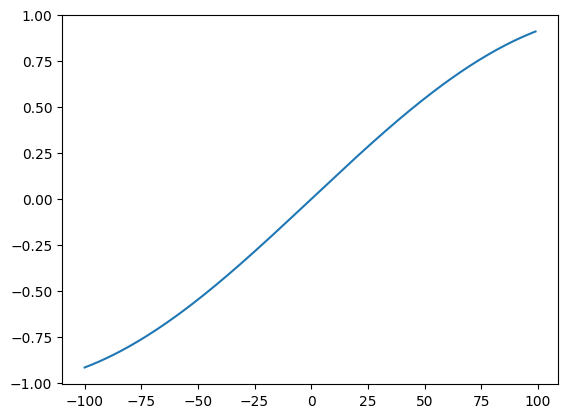

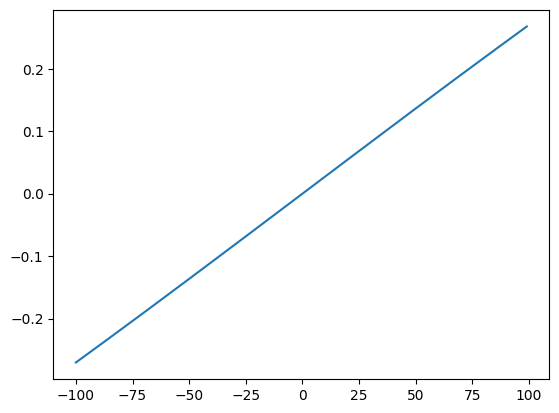

...

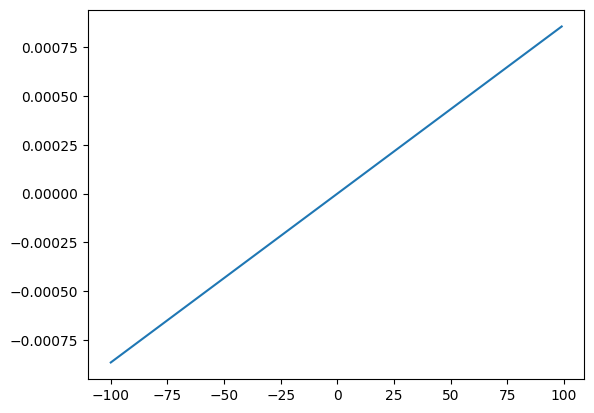

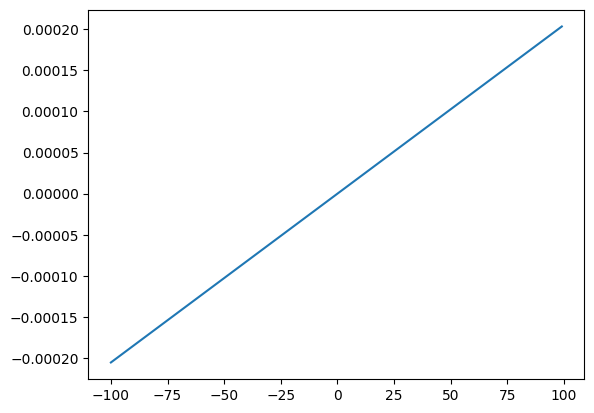

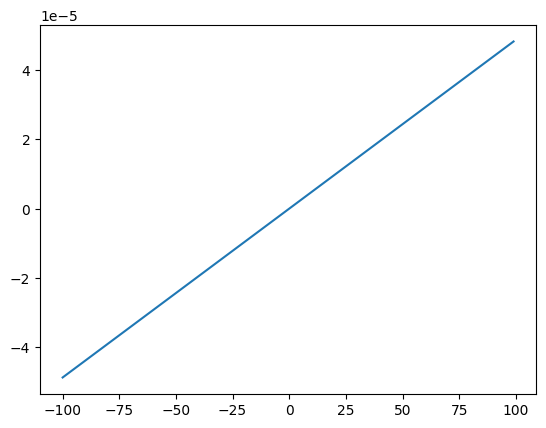

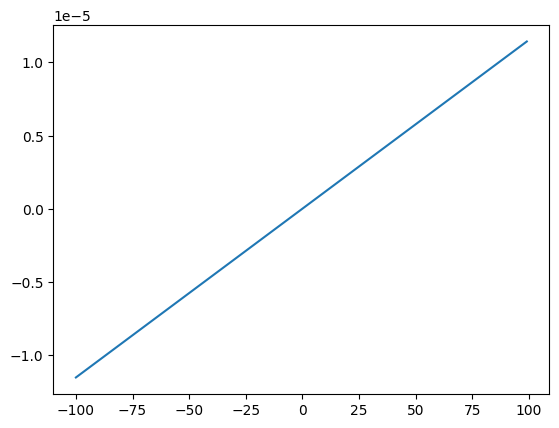

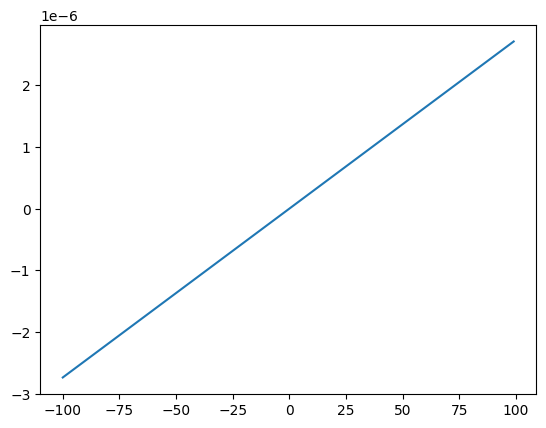

In [23]:
# position encoding for different dimensions i

pos = np.arange(-100,100,)
for i in range(1,128,10):
    y = np.sin(pos/(10000**(2*i/128)))
    plt.plot(pos,y)
    plt.show()

### Subsequent mask to make model not to look into future

In [24]:
def subsequent_mask(size):
    "Mask out subsequent positions."
    attn_shape = (1, size, size)
    subsequent_mask = torch.triu(torch.ones(attn_shape), diagonal=1).type(
        torch.uint8
    )
    return subsequent_mask == 0

In [25]:
subsequent_mask(10)

tensor([[[ True, False, False, False, False, False, False, False, False, False],
         [ True,  True, False, False, False, False, False, False, False, False],
         [ True,  True,  True, False, False, False, False, False, False, False],
         [ True,  True,  True,  True, False, False, False, False, False, False],
         [ True,  True,  True,  True,  True, False, False, False, False, False],
         [ True,  True,  True,  True,  True,  True, False, False, False, False],
         [ True,  True,  True,  True,  True,  True,  True, False, False, False],
         [ True,  True,  True,  True,  True,  True,  True,  True, False, False],
         [ True,  True,  True,  True,  True,  True,  True,  True,  True, False],
         [ True,  True,  True,  True,  True,  True,  True,  True,  True,  True]]])

In [26]:
def example_mask():
    LS_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "Subsequent Mask": subsequent_mask(20)[0][x, y].flatten(),
                    "Window": y,
                    "Masking": x,
                }
            )
            for y in range(20)
            for x in range(20)
        ]
    )

    return (
        alt.Chart(LS_data)
        .mark_rect()
        .properties(height=250, width=250)
        .encode(
            alt.X("Window:O"),
            alt.Y("Masking:O"),
            alt.Color("Subsequent Mask:Q", scale=alt.Scale(scheme="viridis")),
        )
        .interactive()
    )


show_example(example_mask)

alt.Chart(...)

### Attention blocks

![image.png](attachment:image.png)

In [27]:
def mul_scale_attention(query, key, value, mask=None, dropout=None):
    dk = query.size(-1)
    scores = torch.matmul(query,  key.transpose(-2, -1))/np.sqrt(dk)
    if mask is not None:
        scores = scores.masked_fill(mask == 0.0, -1e9)
    p_attn  = scores.softmax(dim=-1)
    if dropout is not None:
        p_attn = dropout(p_attn)
    return torch.matmul(p_attn, value), p_attn

In [28]:
key_test = torch.randn(4, 3)
query_test = torch.randn(4, 3)
value_test = torch.randn(4, 5)
mask = (torch.randn(4, 4) >0.1).float()

In [29]:
mul_scale_attention(query_test, key_test, value_test, mask, nn.Dropout(0.5))

(tensor([[-0.0149, -0.3615, -1.9486, -0.5183, -2.1985],
         [ 0.1372, -0.1215,  0.2323,  0.3775,  0.4017],
         [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000]]),
 tensor([[2.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.6633],
         [0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]))

![image.png](attachment:image.png)

In [30]:
class MultiHeadAttention_v1(nn.Module):

    def __init__(self, d_model, h, dropout=0.5):
        super(MultiHeadAttention_v1, self).__init__()
        self._h_count = h
        self._d_model = d_model
        self._dk = d_model // h
        self._dropout_layer = nn.Dropout(dropout)
        WQ = nn.Parameter(nn.init.xavier_uniform(torch.empty(d_model, self._dk)))
        self._WQs = [torch.clone(WQ) for i in range(h)]
        WK = nn.Parameter(nn.init.xavier_uniform(torch.empty(d_model, self._dk)))
        self._WKs = [torch.clone(WK) for i in range(h)]
        WV = nn.Parameter(nn.init.xavier_uniform(torch.empty(d_model, self._dk)))
        self._WVs = [torch.clone(WV) for i in range(h)]
        self._WO = nn.Parameter(nn.init.xavier_uniform(torch.empty(self._dk*h, d_model)))

    def forward(self, key, query, value, mask=None):
        head_attns = []
        for i in range(self._h_count):
            head_attn, _ = mul_scale_attention(
                torch.matmul(query, self._WQs[i]),
                torch.matmul(key, self._WKs[i]),
                torch.matmul(value, self._WVs[i]),
                mask,
                self._dropout_layer
            )
            head_attns.append(head_attn)
        return torch.matmul(torch.cat(head_attns, axis=1), self._WO)

In [31]:
d_model = 4
key_test = torch.randn(d_model, d_model)
query_test = torch.randn(d_model, d_model)
value_test = torch.randn(d_model, d_model)
mask = (torch.randn(d_model, d_model) >0.1).float()

In [32]:
mlh_attn_v1 = MultiHeadAttention_v1(d_model, 2)

In [33]:
attn1 = mlh_attn_v1.forward(query_test, key_test, value_test)

In [34]:
class MultiHeadedAttention(nn.Module):
    def __init__(self, h, d_model, dropout=0.1):
        "Take in model size and number of heads."
        super(MultiHeadedAttention, self).__init__()
        assert d_model % h == 0
        # We assume d_v always equals d_k
        self.d_k = d_model // h
        self.h = h
        self.linears = clone_layer(nn.Linear(d_model, d_model), 4)
        self.attn = None
        self.dropout = nn.Dropout(p=dropout)

    def forward(self, query, key, value, mask=None):
        "Implements Figure 2"
        if mask is not None:
            # Same mask applied to all h heads.
            mask = mask.unsqueeze(1)
        nbatches = query.size(0)

        # 1) Do all the linear projections in batch from d_model => h x d_k
        query, key, value = [
            lin(x).view(nbatches, -1, self.h, self.d_k).transpose(1, 2)
            for lin, x in zip(self.linears, (query, key, value))
        ]

        # 2) Apply attention on all the projected vectors in batch.
        x, self.attn = mul_scale_attention(
            query, key, value, mask=mask, dropout=self.dropout
        )

        # 3) "Concat" using a view and apply a final linear.
        x = (
            x.transpose(1, 2)
            .contiguous()
            .view(nbatches, -1, self.h * self.d_k)
        )
        del query
        del key
        del value
        return self.linears[-1](x)

In [35]:
d_model = 16
batch_size = 1
h=8
dk = d_model//h
key_test = torch.randn(batch_size, d_model, d_model)
query_test = torch.randn(batch_size, d_model, d_model)
value_test = torch.randn(batch_size, d_model, d_model)
mask = (torch.randn(batch_size, d_model, d_model) >0.1).float()

In [36]:
linears = clone_layer(nn.Linear(d_model, d_model), 4)

In [37]:
for lin, x in zip(linears[:3], (query_test, key_test, value_test)):
    res = lin(x).view(batch_size, -1, 4, 4).transpose(1, 2)
    print(res.size())

torch.Size([1, 4, 16, 4])
torch.Size([1, 4, 16, 4])
torch.Size([1, 4, 16, 4])


In [38]:
query_test, key_test, value_test = [
    lin(x).view(batch_size, -1, d_model, dk).transpose(1, 2)
    for lin, x in zip(linears, (query_test, key_test, value_test))
]

In [39]:
query_test.size(), key_test.size(), value_test.size()

(torch.Size([1, 16, 8, 2]),
 torch.Size([1, 16, 8, 2]),
 torch.Size([1, 16, 8, 2]))

In [40]:
x, attn = mul_scale_attention(
    query_test, key_test, value_test, mask=mask, dropout=None
)


RuntimeError: The size of tensor a (16) must match the size of tensor b (8) at non-singleton dimension 3

In [41]:
x.shape, attn.shape

NameError: name 'attn' is not defined

In [42]:
mlh_attn = MultiHeadedAttention(h, d_model)

In [43]:
attn2 = mlh_attn.forward(key_test, query_test, value_test)

RuntimeError: mat1 and mat2 shapes cannot be multiplied (128x2 and 16x16)

In [44]:
attn2.size()

NameError: name 'attn2' is not defined

### Fully connected layer

In [45]:
class PositionwiseFeedForward(nn.Module):
    """
        An encoder on N layers with normalisation
    """
    def __init__(self, d_model, d_hidden, dropout=0.1):
        super(PositionwiseFeedForward, self).__init__()
        self._W1 = nn.Linear(d_model, d_hidden)
        self._W2 = nn.Linear(d_hidden, d_model)
        self._dropout = nn.Dropout(dropout)

    def forward(self, x_in):
        return self._W2(self._dropout(self._W1(x_in).relu()))

In [46]:
PositionwiseFeedForward(8,8).forward(torch.rand(4,8))

tensor([[-0.2348,  0.2859, -0.0600,  0.2775, -0.3213, -0.0260,  0.0969, -0.0832],
        [-0.2609,  0.3039, -0.0263,  0.3710, -0.2731,  0.0094,  0.0709, -0.1306],
        [-0.2689,  0.2858, -0.0269,  0.3433, -0.2697, -0.0057,  0.0990, -0.1284],
        [-0.2816,  0.2750, -0.0433,  0.2983, -0.3028, -0.0087,  0.1479, -0.0854]],
       grad_fn=<AddmmBackward0>)

### Embeddings

In [49]:
class Embeddings(nn.Module):
    def __init__(self, d_model, vocab):
        super(Embeddings, self).__init__()
        self.lut = nn.Embedding(vocab, d_model)
        self.d_model = d_model

    def forward(self, x):
        return self.lut(x) * math.sqrt(self.d_model)

In [50]:
Embeddings(5,1000).forward(torch.randint(1000, (8,8,8))).size()

torch.Size([8, 8, 8, 5])

### Position Encoding

In [51]:
class PositionalEncoding(nn.Module):
    "Implement the PE function."

    def __init__(self, d_model, dropout, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Compute the positional encodings once in log space.
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len).unsqueeze(1)
        div_term = torch.exp(
            torch.arange(0, d_model, 2) * -(math.log(10000.0) / d_model)
        )
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer("pe", pe)

    def forward(self, x):
        x = x + self.pe[:, : x.size(1)].requires_grad_(False)
        return self.dropout(x)

In [52]:
def example_positional():
    pe = PositionalEncoding(20, 0)
    y = pe.forward(torch.zeros(1, 100, 20))

    data = pd.concat(
        [
            pd.DataFrame(
                {
                    "embedding": y[0, :, dim],
                    "dimension": dim,
                    "position": list(range(100)),
                }
            )
            for dim in [4, 5, 6, 7]
        ]
    )

    return (
        alt.Chart(data)
        .mark_line()
        .properties(width=800)
        .encode(x="position", y="embedding", color="dimension:N")
        .interactive()
    )


show_example(example_positional)

alt.Chart(...)

## Full Model

In [53]:
def make_model(
    src_vocab, tgt_vocab, N=6, d_model=512, d_ff=2048, h=8, dropout=0.1
):
    "Helper: Construct a model from hyperparameters."
    c = copy.deepcopy
    attn = MultiHeadedAttention(h, d_model)
    ff = PositionwiseFeedForward(d_model, d_ff, dropout)
    position = PositionalEncoding(d_model, dropout)
    model = EncoderDecoder(
        Encoder(EncoderLayer(d_model, c(attn), c(ff), dropout), N),
        Decoder(DecoderLayer(d_model, c(attn), c(attn), c(ff), dropout), N),
        nn.Sequential(Embeddings(d_model, src_vocab), c(position)),
        nn.Sequential(Embeddings(d_model, tgt_vocab), c(position)),
        Generator(d_model, tgt_vocab),
    )

    # This was important from their code.
    # Initialize parameters with Glorot / fan_avg.
    for p in model.parameters():
        if p.dim() > 1:
            nn.init.xavier_uniform_(p)
    return model

In [54]:
make_model(11, 11, 2)

EncoderDecoder(
  (encoder): Encoder(
    (_layers): ModuleList(
      (0-1): 2 x EncoderLayer(
        (_attn_layer): MultiHeadedAttention(
          (linears): ModuleList(
            (0-3): 4 x Linear(in_features=512, out_features=512, bias=True)
          )
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (_ffn_layer): PositionwiseFeedForward(
          (_W1): Linear(in_features=512, out_features=2048, bias=True)
          (_W2): Linear(in_features=2048, out_features=512, bias=True)
          (_dropout): Dropout(p=0.1, inplace=False)
        )
        (_sublayers): ModuleList(
          (0-1): 2 x SublayerConnection(
            (_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (_dropout): Dropout(p=0.1, inplace=False)
          )
        )
      )
    )
    (_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
  )
  (decoder): Decoder(
    (_layers): ModuleList(
      (0-1): 2 x DecoderLayer(
        (_self_attn): MultiHeadedAt

### Inference test

In [55]:
def inference_test():
    test_model = make_model(11, 11, 2)
    test_model.eval()
    src = torch.LongTensor([[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]])
    src_mask = torch.ones(1, 1, 10)

    memory = test_model.encode(src, src_mask)
    ys = torch.zeros(1, 1).type_as(src)

    for i in range(9):
        out = test_model.decode(
            memory, src_mask, ys, subsequent_mask(ys.size(1)).type_as(src.data)
        )
        prob = test_model.generator(out[:, -1])
        _, next_word = torch.max(prob, dim=1)
        next_word = next_word.data[0]
        ys = torch.cat(
            [ys, torch.empty(1, 1).type_as(src.data).fill_(next_word)], dim=1
        )

    print("Example Untrained Model Prediction:", ys)

In [56]:
def run_tests():
    for _ in range(10):
        inference_test()

In [57]:
show_example(run_tests)

Example Untrained Model Prediction: tensor([[ 0,  1,  6, 10,  4,  6, 10,  4,  6, 10]])
Example Untrained Model Prediction: tensor([[0, 2, 2, 2, 2, 2, 2, 2, 2, 2]])
Example Untrained Model Prediction: tensor([[ 0,  9, 10,  8,  9, 10,  8,  3,  7,  9]])
Example Untrained Model Prediction: tensor([[ 0, 10,  3,  2,  7,  2,  7,  2,  7,  2]])
Example Untrained Model Prediction: tensor([[0, 6, 6, 6, 6, 6, 6, 6, 6, 6]])
Example Untrained Model Prediction: tensor([[0, 1, 1, 1, 0, 1, 0, 1, 0, 1]])
Example Untrained Model Prediction: tensor([[ 0,  1,  2,  1,  3,  5,  2, 10, 10, 10]])
Example Untrained Model Prediction: tensor([[ 0, 10, 10, 10, 10, 10, 10, 10, 10, 10]])
Example Untrained Model Prediction: tensor([[ 0,  7,  7,  7,  7,  7,  7, 10,  5,  7]])
Example Untrained Model Prediction: tensor([[0, 9, 4, 3, 3, 3, 3, 3, 3, 3]])


## Model Training

In [58]:
class Batch:
    """Object for holding a batch of data with mask during training."""

    def __init__(self, src, tgt=None, pad=2):  # 2 = <blank>
        self.src = src
        self.src_mask = (src != pad).unsqueeze(-2)
        if tgt is not None:
            self.tgt = tgt[:, :-1]
            self.tgt_y = tgt[:, 1:]
            self.tgt_mask = self.make_std_mask(self.tgt, pad)
            self.ntokens = (self.tgt_y != pad).data.sum()

    @staticmethod
    def make_std_mask(tgt, pad):
        "Create a mask to hide padding and future words."
        tgt_mask = (tgt != pad).unsqueeze(-2)
        tgt_mask = tgt_mask & subsequent_mask(tgt.size(-1)).type_as(
            tgt_mask.data
        )
        return tgt_mask

### Training Loop

In [59]:
class TrainState:
    """Track number of steps, examples, and tokens processed"""

    step: int = 0  # Steps in the current epoch
    accum_step: int = 0  # Number of gradient accumulation steps
    samples: int = 0  # total # of examples used
    tokens: int = 0  # total # of tokens processed

In [60]:
def run_epoch(
    data_iter,
    model,
    loss_compute,
    optimizer,
    scheduler,
    mode="train",
    accum_iter=1,
    train_state=TrainState(),
):
    """Train a single epoch"""
    start = time.time()
    total_tokens = 0
    total_loss = 0
    tokens = 0
    n_accum = 0
    for i, batch in enumerate(data_iter):
        out = model.forward(
            batch.src, batch.tgt, batch.src_mask, batch.tgt_mask
        )
        loss, loss_node = loss_compute(out, batch.tgt_y, batch.ntokens)
        # loss_node = loss_node / accum_iter
        if mode == "train" or mode == "train+log":
            loss_node.backward()
            train_state.step += 1
            train_state.samples += batch.src.shape[0]
            train_state.tokens += batch.ntokens
            if i % accum_iter == 0:
                optimizer.step()
                optimizer.zero_grad(set_to_none=True)
                n_accum += 1
                train_state.accum_step += 1
            scheduler.step()

        total_loss += loss
        total_tokens += batch.ntokens
        tokens += batch.ntokens
        if i % 40 == 1 and (mode == "train" or mode == "train+log"):
            lr = optimizer.param_groups[0]["lr"]
            elapsed = time.time() - start
            print(
                (
                    "Epoch Step: %6d | Accumulation Step: %3d | Loss: %6.2f "
                    + "| Tokens / Sec: %7.1f | Learning Rate: %6.1e"
                )
                % (i, n_accum, loss / batch.ntokens, tokens / elapsed, lr)
            )
            start = time.time()
            tokens = 0
        del loss
        del loss_node
    return total_loss / total_tokens, train_state

### Optimizer

In [61]:
def rate(step, model_size, factor, warmup):
    """
    we have to default the step to 1 for LambdaLR function
    to avoid zero raising to negative power.
    """
    if step == 0:
        step = 1
    return factor * (
        model_size ** (-0.5) * min(step ** (-0.5), step * warmup ** (-1.5))
    )

In [62]:
def example_learning_schedule():
    opts = [
        [512, 1, 4000],  # example 1
        [512, 1, 8000],  # example 2
        [256, 1, 4000],  # example 3
    ]

    dummy_model = torch.nn.Linear(1, 1)
    learning_rates = []

    # we have 3 examples in opts list.
    for idx, example in enumerate(opts):
        # run 20000 epoch for each example
        optimizer = torch.optim.Adam(
            dummy_model.parameters(), lr=1, betas=(0.9, 0.98), eps=1e-9
        )
        lr_scheduler = LambdaLR(
            optimizer=optimizer, lr_lambda=lambda step: rate(step, *example)
        )
        tmp = []
        # take 20K dummy training steps, save the learning rate at each step
        for step in range(20000):
            tmp.append(optimizer.param_groups[0]["lr"])
            optimizer.step()
            lr_scheduler.step()
        learning_rates.append(tmp)

    learning_rates = torch.tensor(learning_rates)

    # Enable altair to handle more than 5000 rows
    alt.data_transformers.disable_max_rows()

    opts_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "Learning Rate": learning_rates[warmup_idx, :],
                    "model_size:warmup": ["512:4000", "512:8000", "256:4000"][
                        warmup_idx
                    ],
                    "step": range(20000),
                }
            )
            for warmup_idx in [0, 1, 2]
        ]
    )
    return (
        alt.Chart(opts_data)
        .mark_line()
        .properties(width=600)
        .encode(x="step", y="Learning Rate", color="model_size\:warmup:N")
        .interactive()
    )


example_learning_schedule()

alt.Chart(...)

### Label-smoothing with KL -divergence

In [69]:
predict_logits = torch.FloatTensor(
        [
            [0, 0.2, 0.7, 0.1, 0],
            [0.1, 0.0, 0.8, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
        ]
    )
target_values = torch.LongTensor([2, 1, 0, 3, 3])

In [70]:
logprobs  = F.log_softmax(predict_logits, dim=-1)

In [71]:
nll_loss = -logprobs.gather(dim=-1, index=target_values.unsqueeze(1))

In [72]:
nll_loss

tensor([[1.1469],
        [1.8619],
        [1.8469],
        [1.7469],
        [1.7469]])

In [73]:
nll_loss = nll_loss.squeeze(1)

In [74]:
nll_loss

tensor([1.1469, 1.8619, 1.8469, 1.7469, 1.7469])

In [75]:
smooth_loss = -logprobs.mean(dim=-1)

In [76]:
smooth_loss

tensor([1.6469, 1.6619, 1.6469, 1.6469, 1.6469])

In [77]:
loss = (1-0.5) * nll_loss + 0.5 * smooth_loss

In [78]:
loss, loss.mean()

(tensor([1.3969, 1.7619, 1.7469, 1.6969, 1.6969]), tensor(1.6599))

In [79]:
kl_loss = nn.KLDivLoss(reduction="batchmean")
# input should be a distribution in the log space
input = F.log_softmax(predict_logits, dim=-1)
# Sample a batch of distributions. Usually this would come from the dataset
target = F.softmax(target_values.float(), dim=-1)
kl_loss(input, target)

tensor(0.5395)

In [80]:
F.log_softmax(target_values.float(), dim=-1)

tensor([-1.9373, -2.9373, -3.9373, -0.9373, -0.9373])

In [81]:
target_values, F.softmax(target_values.float(), dim=-1), F.softmax(target_values.unsqueeze(1).float(), dim=-1),

(tensor([2, 1, 0, 3, 3]),
 tensor([0.1441, 0.0530, 0.0195, 0.3917, 0.3917]),
 tensor([[1.],
         [1.],
         [1.],
         [1.],
         [1.]]))

In [82]:
kl_loss = nn.KLDivLoss(reduction="batchmean", log_target=True)
log_target = F.log_softmax(target_values.unsqueeze(1).float(), dim=1)
kl_loss(input, log_target)

tensor(8.2496)

In [83]:
true_dist = predict_logits.data.clone()

In [84]:
true_dist, target_values

(tensor([[0.0000, 0.2000, 0.7000, 0.1000, 0.0000],
         [0.1000, 0.0000, 0.8000, 0.1000, 0.0000],
         [0.0000, 0.2000, 0.7000, 0.1000, 0.0000],
         [0.0000, 0.2000, 0.7000, 0.1000, 0.0000],
         [0.0000, 0.2000, 0.7000, 0.1000, 0.0000]]),
 tensor([2, 1, 0, 3, 3]))

In [85]:
smoothing=0.2
size=5

In [86]:
true_dist.fill_(smoothing / (size - 2))

tensor([[0.0667, 0.0667, 0.0667, 0.0667, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.0667, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.0667, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.0667, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.0667, 0.0667]])

In [87]:
target_values.data.unsqueeze(1)

tensor([[2],
        [1],
        [0],
        [3],
        [3]])

In [88]:
true_dist.scatter_(1, target_values.data.unsqueeze(1), (1-smoothing))

tensor([[0.0667, 0.0667, 0.8000, 0.0667, 0.0667],
        [0.0667, 0.8000, 0.0667, 0.0667, 0.0667],
        [0.8000, 0.0667, 0.0667, 0.0667, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.8000, 0.0667],
        [0.0667, 0.0667, 0.0667, 0.8000, 0.0667]])

In [89]:
# class LabelSmoothingLoss(torch.nn.Module):
#     def __init__(
#             self,
#             smoothing: float = 0.1,
#             reduction="mean",
#     ):
#         super(LabelSmoothingLoss, self).__init__()
#         self.smoothing   = smoothing
#         self.reduction = reduction

#     def reduce_loss(self, loss):
#         return loss.mean() if self.reduction == 'mean' else loss.sum() \
#          if self.reduction == 'sum' else loss

#     def linear_combination(self, x, y):
#         return self.smoothing * x + (1 - self.smoothing) * y

#     def forward(self, preds, target):

#         n = preds.size(-1)
#         log_preds = F.log_softmax(preds, dim=-1)
#         loss = self.reduce_loss(-log_preds.sum(dim=-1))
#         nll = F.nll_loss(
#             log_preds, target, reduction=self.reduction, weight=self.weight
#         )
#         return self.linear_combination(loss / n, nll)

In [90]:
class LabelSmoothing(nn.Module):
    "Implement label smoothing."

    def __init__(self, size, padding_idx, smoothing=0.0):
        super(LabelSmoothing, self).__init__()
        self.criterion = nn.KLDivLoss(reduction="sum")
        self.padding_idx = padding_idx
        self.confidence = 1.0 - smoothing
        self.smoothing = smoothing
        self.size = size
        self.true_dist = None

    def forward(self, x, target):
        assert x.size(1) == self.size
        true_dist = x.data.clone()
        true_dist.fill_(self.smoothing / (self.size - 2))
        true_dist.scatter_(1, target.data.unsqueeze(1), self.confidence)
        true_dist[:, self.padding_idx] = 0
        mask = torch.nonzero(target.data == self.padding_idx)
        if mask.dim() > 0:
            true_dist.index_fill_(0, mask.squeeze(), 0.0)
        self.true_dist = true_dist
        return self.criterion(x, true_dist.clone().detach())

In [91]:
# Example of label smoothing.


def example_label_smoothing():
    crit = LabelSmoothing(5, 0, 0.4)
    predict = torch.FloatTensor(
        [
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
            [0, 0.2, 0.7, 0.1, 0],
        ]
    )
    kl_dist = crit(x=predict.log(), target=torch.LongTensor([2, 1, 0, 3, 3]))
    print(kl_dist)
    LS_data = pd.concat(
        [
            pd.DataFrame(
                {
                    "target distribution": crit.true_dist[x, y].flatten(),
                    "columns": y,
                    "rows": x,
                }
            )
            for y in range(5)
            for x in range(5)
        ]
    )

    return (
        alt.Chart(LS_data)
        .mark_rect(color="Blue", opacity=1)
        .properties(height=200, width=200)
        .encode(
            alt.X("columns:O", title=None),
            alt.Y("rows:O", title=None),
            alt.Color(
                "target distribution:Q", scale=alt.Scale(scheme="viridis")
            ),
        )
        .interactive()
    )


show_example(example_label_smoothing)

tensor(nan)


alt.Chart(...)

#### Loss function

In [92]:
def loss(x, crit):
    d = x + 3 * 1
    predict = torch.FloatTensor([[1e-10, x / d, 1 / d, 1 / d, 1 / d]])
    return crit(predict.log(), torch.LongTensor([1])).data

In [93]:
def penalization_visualization():
    crit = LabelSmoothing(5, 0, 0.1)
    loss_data = pd.DataFrame(
        {
            "Loss": [loss(x, crit) for x in range(1, 100)],
            "Steps": list(range(99)),
        }
    ).astype("float")

    return (
        alt.Chart(loss_data)
        .mark_line()
        .properties(width=350)
        .encode(
            x="Steps",
            y="Loss",
        )
        .interactive()
    )

show_example(penalization_visualization)

alt.Chart(...)

### First example

In [94]:
def data_gen(V, batch_size, nbatches):
    "Generate random data for a src-tgt copy task."
    for i in range(nbatches):
        data = torch.randint(1, V, size=(batch_size, 10))
        data[:, 0] = 1
        src = data.requires_grad_(False).clone().detach()
        tgt = data.requires_grad_(False).clone().detach()
        yield Batch(src, tgt, 0)

#### Loss computation

In [96]:
class SimpleLossCompute:
    "A simple loss compute and train function."

    def __init__(self, generator, criterion):
        self.generator = generator
        self.criterion = criterion

    def __call__(self, x, y, norm):
        x = self.generator(x)
        sloss = (
            self.criterion(
                x.contiguous().view(-1, x.size(-1)), y.contiguous().view(-1)
            )
            / norm
        )
        return sloss.data * norm, sloss

#### Greedy decoding

In [97]:
def greedy_decode(model, src, src_mask, max_len, start_symbol):
    memory = model.encode(src, src_mask)
    ys = torch.zeros(1, 1).fill_(start_symbol).type_as(src.data)
    for i in range(max_len - 1):
        out = model.decode(
            memory, src_mask, ys, subsequent_mask(ys.size(1)).type_as(src.data)
        )
        prob = model.generator(out[:, -1])
        _, next_word = torch.max(prob, dim=1)
        next_word = next_word.data[0]
        ys = torch.cat(
            [ys, torch.zeros(1, 1).type_as(src.data).fill_(next_word)], dim=1
        )
    return ys

In [98]:
# Train the simple copy task.

def example_simple_model():
    V = 11
    criterion = LabelSmoothing(size=V, padding_idx=0, smoothing=0.0)
    model = make_model(V, V, N=2)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=0.5, betas=(0.9, 0.98), eps=1e-9
    )
    lr_scheduler = LambdaLR(
        optimizer=optimizer,
        lr_lambda=lambda step: rate(
            step, model_size=model.src_embed[0].d_model, factor=1.0, warmup=400
        ),
    )

    batch_size = 80
    for epoch in range(20):
        model.train()
        run_epoch(
            data_gen(V, batch_size, 20),
            model,
            SimpleLossCompute(model.generator, criterion),
            optimizer,
            lr_scheduler,
            mode="train",
        )
        model.eval()
        run_epoch(
            data_gen(V, batch_size, 5),
            model,
            SimpleLossCompute(model.generator, criterion),
            DummyOptimizer(),
            DummyScheduler(),
            mode="eval",
        )[0]

    model.eval()
    src = torch.LongTensor([[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]])
    max_len = src.shape[1]
    src_mask = torch.ones(1, 1, max_len)
    print(greedy_decode(model, src, src_mask, max_len=max_len, start_symbol=0))



In [99]:
execute_example(example_simple_model)

Epoch Step:      1 | Accumulation Step:   2 | Loss:   3.42 | Tokens / Sec:   418.1 | Learning Rate: 5.5e-06
Epoch Step:      1 | Accumulation Step:   2 | Loss:   2.13 | Tokens / Sec:   542.3 | Learning Rate: 6.1e-05
Epoch Step:      1 | Accumulation Step:   2 | Loss:   1.82 | Tokens / Sec:   460.6 | Learning Rate: 1.2e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   1.61 | Tokens / Sec:   540.8 | Learning Rate: 1.7e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   1.15 | Tokens / Sec:   421.0 | Learning Rate: 2.3e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   0.72 | Tokens / Sec:   541.4 | Learning Rate: 2.8e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   0.41 | Tokens / Sec:   412.0 | Learning Rate: 3.4e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   0.23 | Tokens / Sec:   546.5 | Learning Rate: 3.9e-04
Epoch Step:      1 | Accumulation Step:   2 | Loss:   0.14 | Tokens / Sec:   533.9 | Learning Rate: 4.5e-04
Epoch Step:      1 | Accumul

In [100]:
# Load spacy tokenizer models, download them if they haven't been
# downloaded already

def load_tokenizers():

    try:
        spacy_de = spacy.load("de_core_news_sm")
    except IOError:
        os.system("python -m spacy download de_core_news_sm")
        spacy_de = spacy.load("de_core_news_sm")

    try:
        spacy_en = spacy.load("en_core_web_sm")
    except IOError:
        os.system("python -m spacy download en_core_web_sm")
        spacy_en = spacy.load("en_core_web_sm")

    return spacy_de, spacy_en

In [101]:
def tokenize(text, tokenizer):
    return [tok.text for tok in tokenizer.tokenizer(text)]

In [102]:
def yield_tokens(data_iter, tokenizer, index):
    for from_to_tuple in data_iter:
        try:
            yield tokenizer(from_to_tuple[index])
        except UnicodeDecodeError as ex:
            print(ex)
            yield []

In [103]:
def build_vocabulary(spacy_de, spacy_en):
    def tokenize_de(text):
        return tokenize(text, spacy_de)

    def tokenize_en(text):
        return tokenize(text, spacy_en)

    print("Building German Vocabulary ...")
    train, val, test = datasets.Multi30k(language_pair=("de", "en"))
    vocab_src = build_vocab_from_iterator(
        yield_tokens(train + val + test, tokenize_de, index=0),
        min_freq=2,
        specials=["<s>", "</s>", "<blank>", "<unk>"],
    )

    print("Building English Vocabulary ...")
    train, val, test = datasets.Multi30k(language_pair=("de", "en"))
    vocab_tgt = build_vocab_from_iterator(
        yield_tokens(train + val + test, tokenize_en, index=1),
        min_freq=2,
        specials=["<s>", "</s>", "<blank>", "<unk>"],
    )

    vocab_src.set_default_index(vocab_src["<unk>"])
    vocab_tgt.set_default_index(vocab_tgt["<unk>"])

    return vocab_src, vocab_tgt

In [104]:
def load_vocab(spacy_de, spacy_en):
    if not exists("vocab.pt"):
        vocab_src, vocab_tgt = build_vocabulary(spacy_de, spacy_en)
        torch.save((vocab_src, vocab_tgt), "vocab.pt")
    else:
        vocab_src, vocab_tgt = torch.load("vocab.pt")
    print("Finished.\nVocabulary sizes:")
    print(len(vocab_src))
    print(len(vocab_tgt))
    return vocab_src, vocab_tgt

In [109]:
if is_interactive_notebook():
    # global variables used later in the script
    spacy_de, spacy_en = show_example(load_tokenizers)
    vocab_src, vocab_tgt = show_example(load_vocab, args=[spacy_de, spacy_en])

Finished.
Vocabulary sizes:
8316
6384


In [107]:
# !pip install portalocker>=2.0.0

In [ ]:
train, val, test = datasets.Multi30k(language_pair=("de", "en"))

In [ ]:
for x in train:
    print(x)
    breaK

('Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.', 'Two young, White males are outside near many bushes.')


NameError: name 'breaK' is not defined

In [ ]:
def tokenize_de(text):
    return tokenize(text, spacy_de)

def tokenize_en(text):
    return tokenize(text, spacy_en)

In [ ]:
tokenize('Eine Frau mit einer großen Geldbörse geht an einem Tor vorbei.', spacy_de)

['Eine',
 'Frau',
 'mit',
 'einer',
 'großen',
 'Geldbörse',
 'geht',
 'an',
 'einem',
 'Tor',
 'vorbei',
 '.']

In [ ]:
try:
    vocab_src = build_vocab_from_iterator(
        yield_tokens(train + val + test, tokenize_de, index=0),
        min_freq=2,
        specials=["<s>", "</s>", "<blank>", "<unk>"],
    )
except Exception as ex:
    print(ex)

Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.
['Zwei', 'junge', 'weiße', 'Männer', 'sind', 'im', 'Freien', 'in', 'der', 'Nähe', 'vieler', 'Büsche', '.']
Mehrere Männer mit Schutzhelmen bedienen ein Antriebsradsystem.
['Mehrere', 'Männer', 'mit', 'Schutzhelmen', 'bedienen', 'ein', 'Antriebsradsystem', '.']
Ein kleines Mädchen klettert in ein Spielhaus aus Holz.
['Ein', 'kleines', 'Mädchen', 'klettert', 'in', 'ein', 'Spielhaus', 'aus', 'Holz', '.']
Ein Mann in einem blauen Hemd steht auf einer Leiter und putzt ein Fenster.
['Ein', 'Mann', 'in', 'einem', 'blauen', 'Hemd', 'steht', 'auf', 'einer', 'Leiter', 'und', 'putzt', 'ein', 'Fenster', '.']
Zwei Männer stehen am Herd und bereiten Essen zu.
['Zwei', 'Männer', 'stehen', 'am', 'Herd', 'und', 'bereiten', 'Essen', 'zu', '.']
Ein Mann in grün hält eine Gitarre, während der andere Mann sein Hemd ansieht.
['Ein', 'Mann', 'in', 'grün', 'hält', 'eine', 'Gitarre', ',', 'während', 'der', 'andere', 'Mann', 'sein', 'Hemd', 'ansi

In [ ]:
for x in yield_tokens(train + val + test, tokenize_de, index=0):
    print(x)

Zwei junge weiße Männer sind im Freien in der Nähe vieler Büsche.
['Zwei', 'junge', 'weiße', 'Männer', 'sind', 'im', 'Freien', 'in', 'der', 'Nähe', 'vieler', 'Büsche', '.']
Mehrere Männer mit Schutzhelmen bedienen ein Antriebsradsystem.
['Mehrere', 'Männer', 'mit', 'Schutzhelmen', 'bedienen', 'ein', 'Antriebsradsystem', '.']
Ein kleines Mädchen klettert in ein Spielhaus aus Holz.
['Ein', 'kleines', 'Mädchen', 'klettert', 'in', 'ein', 'Spielhaus', 'aus', 'Holz', '.']
Ein Mann in einem blauen Hemd steht auf einer Leiter und putzt ein Fenster.
['Ein', 'Mann', 'in', 'einem', 'blauen', 'Hemd', 'steht', 'auf', 'einer', 'Leiter', 'und', 'putzt', 'ein', 'Fenster', '.']
Zwei Männer stehen am Herd und bereiten Essen zu.
['Zwei', 'Männer', 'stehen', 'am', 'Herd', 'und', 'bereiten', 'Essen', 'zu', '.']
Ein Mann in grün hält eine Gitarre, während der andere Mann sein Hemd ansieht.
['Ein', 'Mann', 'in', 'grün', 'hält', 'eine', 'Gitarre', ',', 'während', 'der', 'andere', 'Mann', 'sein', 'Hemd', 'ansi

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x80 in position 37: invalid start byte

### Dataloaders

In [110]:
def collate_batch(
    batch,
    src_pipeline,
    tgt_pipeline,
    src_vocab,
    tgt_vocab,
    device,
    max_padding=128,
    pad_id=2,
):
    bs_id = torch.tensor([0], device=device)  # <s> token id
    eos_id = torch.tensor([1], device=device)  # </s> token id
    src_list, tgt_list = [], []
    for (_src, _tgt) in batch:
        processed_src = torch.cat(
            [
                bs_id,
                torch.tensor(
                    src_vocab(src_pipeline(_src)),
                    dtype=torch.int64,
                    device=device,
                ),
                eos_id,
            ],
            0,
        )
        processed_tgt = torch.cat(
            [
                bs_id,
                torch.tensor(
                    tgt_vocab(tgt_pipeline(_tgt)),
                    dtype=torch.int64,
                    device=device,
                ),
                eos_id,
            ],
            0,
        )
        src_list.append(
            # warning - overwrites values for negative values of padding - len
            pad(
                processed_src,
                (
                    0,
                    max_padding - len(processed_src),
                ),
                value=pad_id,
            )
        )
        tgt_list.append(
            pad(
                processed_tgt,
                (0, max_padding - len(processed_tgt)),
                value=pad_id,
            )
        )

    src = torch.stack(src_list)
    tgt = torch.stack(tgt_list)
    return (src, tgt)

In [111]:
def create_dataloaders(
    device,
    vocab_src,
    vocab_tgt,
    spacy_de,
    spacy_en,
    batch_size=12000,
    max_padding=128,
    is_distributed=True,
):
    # def create_dataloaders(batch_size=12000):
    def tokenize_de(text):
        return tokenize(text, spacy_de)

    def tokenize_en(text):
        return tokenize(text, spacy_en)

    def collate_fn(batch):
        return collate_batch(
            batch,
            tokenize_de,
            tokenize_en,
            vocab_src,
            vocab_tgt,
            device,
            max_padding=max_padding,
            pad_id=vocab_src.get_stoi()["<blank>"],
        )

    train_iter, valid_iter, test_iter = datasets.Multi30k(
        language_pair=("de", "en")
    )

    train_iter_map = to_map_style_dataset(
        train_iter
    )  # DistributedSampler needs a dataset len()
    train_sampler = (
        DistributedSampler(train_iter_map) if is_distributed else None
    )
    valid_iter_map = to_map_style_dataset(valid_iter)
    valid_sampler = (
        DistributedSampler(valid_iter_map) if is_distributed else None
    )

    train_dataloader = DataLoader(
        train_iter_map,
        batch_size=batch_size,
        shuffle=(train_sampler is None),
        sampler=train_sampler,
        collate_fn=collate_fn,
    )
    valid_dataloader = DataLoader(
        valid_iter_map,
        batch_size=batch_size,
        shuffle=(valid_sampler is None),
        sampler=valid_sampler,
        collate_fn=collate_fn,
    )
    return train_dataloader, valid_dataloader

### Training the System

In [112]:
def train_worker(
    gpu,
    ngpus_per_node,
    vocab_src,
    vocab_tgt,
    spacy_de,
    spacy_en,
    config,
    is_distributed=False,
):
    print(f"Train worker process using GPU: {gpu} for training", flush=True)
    torch.cuda.set_device(gpu)

    pad_idx = vocab_tgt["<blank>"]
    d_model = 512
    model = make_model(len(vocab_src), len(vocab_tgt), N=6)
    model.cuda(gpu)
    module = model
    is_main_process = True
    if is_distributed:
        dist.init_process_group(
            "nccl", init_method="env://", rank=gpu, world_size=ngpus_per_node
        )
        model = DDP(model, device_ids=[gpu])
        module = model.module
        is_main_process = gpu == 0

    criterion = LabelSmoothing(
        size=len(vocab_tgt), padding_idx=pad_idx, smoothing=0.1
    )
    criterion.cuda(gpu)

    train_dataloader, valid_dataloader = create_dataloaders(
        gpu,
        vocab_src,
        vocab_tgt,
        spacy_de,
        spacy_en,
        batch_size=config["batch_size"] // ngpus_per_node,
        max_padding=config["max_padding"],
        is_distributed=is_distributed,
    )

    optimizer = torch.optim.Adam(
        model.parameters(), lr=config["base_lr"], betas=(0.9, 0.98), eps=1e-9
    )
    lr_scheduler = LambdaLR(
        optimizer=optimizer,
        lr_lambda=lambda step: rate(
            step, d_model, factor=1, warmup=config["warmup"]
        ),
    )
    train_state = TrainState()

    for epoch in range(config["num_epochs"]):
        if is_distributed:
            train_dataloader.sampler.set_epoch(epoch)
            valid_dataloader.sampler.set_epoch(epoch)

        model.train()
        print(f"[GPU{gpu}] Epoch {epoch} Training ====", flush=True)
        _, train_state = run_epoch(
            (Batch(b[0], b[1], pad_idx) for b in train_dataloader),
            model,
            SimpleLossCompute(module.generator, criterion),
            optimizer,
            lr_scheduler,
            mode="train+log",
            accum_iter=config["accum_iter"],
            train_state=train_state,
        )

        GPUtil.showUtilization()
        if is_main_process:
            file_path = "%s%.2d.pt" % (config["file_prefix"], epoch)
            torch.save(module.state_dict(), file_path)
        torch.cuda.empty_cache()

        print(f"[GPU{gpu}] Epoch {epoch} Validation ====", flush=True)
        model.eval()
        sloss = run_epoch(
            (Batch(b[0], b[1], pad_idx) for b in valid_dataloader),
            model,
            SimpleLossCompute(module.generator, criterion),
            DummyOptimizer(),
            DummyScheduler(),
            mode="eval",
        )
        print(sloss)
        torch.cuda.empty_cache()

    if is_main_process:
        file_path = "%sfinal.pt" % config["file_prefix"]
        torch.save(module.state_dict(), file_path)

In [113]:
def train_distributed_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config):
    from the_annotated_transformer import train_worker

    ngpus = torch.cuda.device_count()
    os.environ["MASTER_ADDR"] = "localhost"
    os.environ["MASTER_PORT"] = "12356"
    print(f"Number of GPUs detected: {ngpus}")
    print("Spawning training processes ...")
    mp.spawn(
        train_worker,
        nprocs=ngpus,
        args=(ngpus, vocab_src, vocab_tgt, spacy_de, spacy_en, config, True),
    )

In [114]:
def train_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config):
    if config["distributed"]:
        train_distributed_model(
            vocab_src, vocab_tgt, spacy_de, spacy_en, config
        )
    else:
        train_worker(
            0, 1, vocab_src, vocab_tgt, spacy_de, spacy_en, config, False
        )

In [115]:
def load_trained_model():
    config = {
        "batch_size": 32,
        "distributed": False,
        "num_epochs": 8,
        "accum_iter": 10,
        "base_lr": 1.0,
        "max_padding": 72,
        "warmup": 3000,
        "file_prefix": "multi30k_model_",
    }
    model_path = "multi30k_model_final.pt"
    if not exists(model_path):
        train_model(vocab_src, vocab_tgt, spacy_de, spacy_en, config)

    model = make_model(len(vocab_src), len(vocab_tgt), N=6)
    model.load_state_dict(torch.load("multi30k_model_final.pt"))
    return model

In [116]:
if is_interactive_notebook():
    model = load_trained_model()

Train worker process using GPU: 0 for training


RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx